In [1]:
include("../ToolBox/ToolBox.jl")
import JLD
using Colors

In [2]:
# Load
co_gamma = JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/co_coherence_VV.jld","data")
pre_gamma = JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/pre_coherence_VV.jld","data")

co_VV = JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/co_intens_VV.jld","data")
pre1_VV= JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/pre_master_VV.jld","data")
pre2_VV = JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/pre_slave_VV.jld","data");

co_VH = JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/co_intens_VH.jld","data")
pre1_VH = JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/pre_master_VH.jld","data")
pre2_VH = JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/pre_slave_VH.jld","data");

In [20]:
coVH_gamma = JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/co_coherence_VH.jld","data")
preVH_gamma = JLD.load("/Users/simon/Data/Sentinel/vejle_oktober/multilooked/pre_coherence_VH.jld","data");

In [3]:
function scale(img , min , max)
    log_img = (log.(img).-min)./(max-min)
    log_img[log_img.>1] .= 1
    log_img[log_img.<0] .= 0
    return log_img
end

scale (generic function with 1 method)

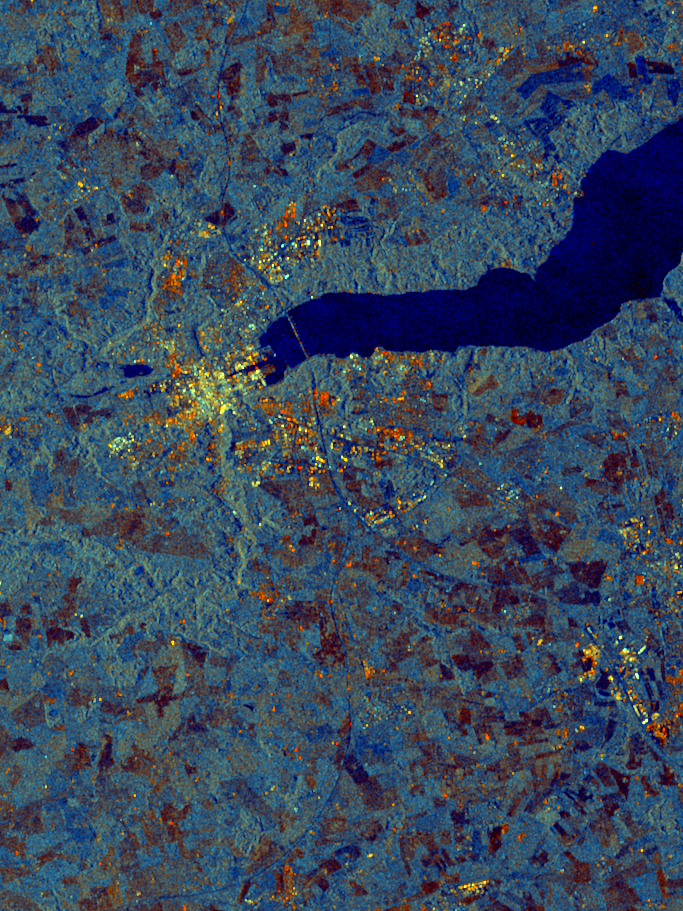

In [51]:
co_ratio = co_VH./co_VV;
co_event = Colors.RGB{Float32}.(scale(co_VV,12,17),scale(co_VH,10,15),scale(co_ratio,-3.5,1.5))[1:2:end,1:7:end]

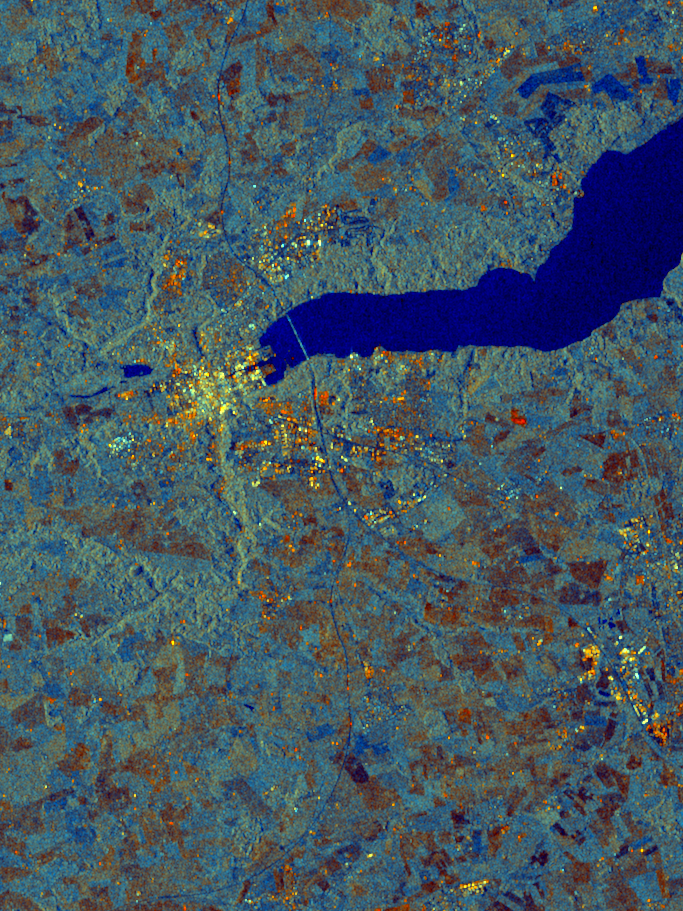

In [52]:
pre1_ratio = pre1_VH./pre1_VV;
pre1_event = Colors.RGB{Float32}.(scale(pre1_VV,12,17),scale(pre1_VH,10,15),scale(pre1_ratio,-3.5,1.5))[1:2:end,1:7:end]

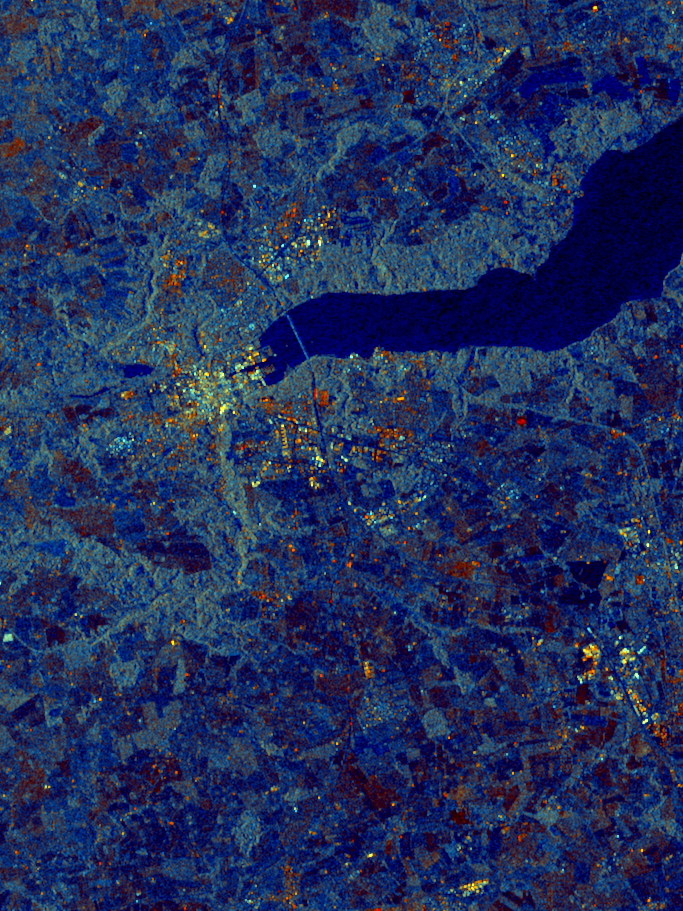

In [54]:
pre2_ratio = pre2_VH./pre2_VV;
pre2_event = Colors.RGB{Float32}.(scale(pre2_VV,12,17),scale(pre2_VH,10,15),scale(pre2_ratio,-3.5,1.5))[1:2:end,1:7:end]

In [ ]:
## Scale intensity 
maximum(maximum(log.(co_VH))),minimum(minimum(log.(co_VH)))

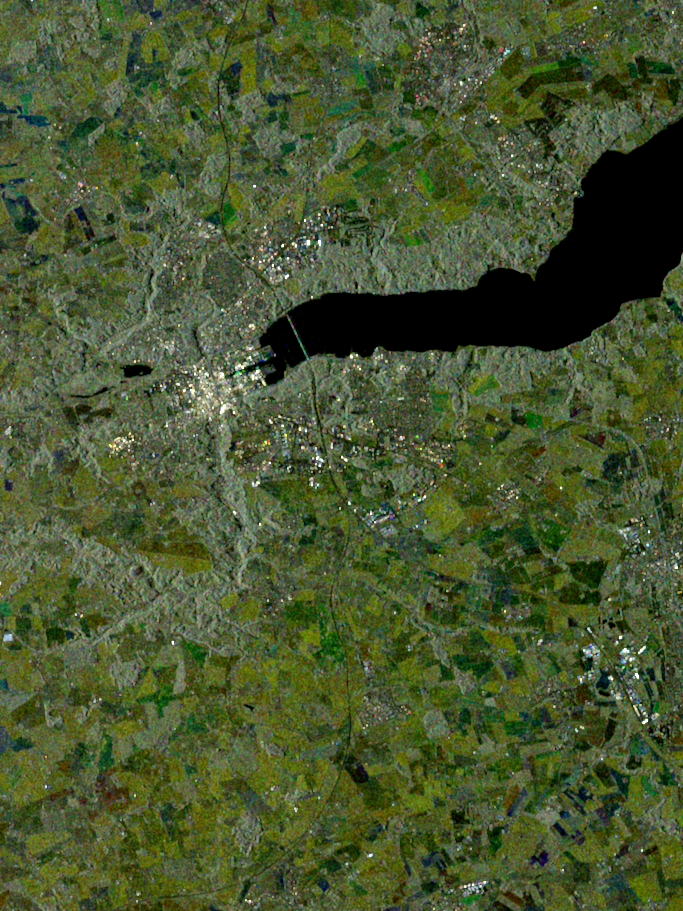

In [23]:
intensVH1 = Colors.RGB{Float32}.(scale(co_VH,10,15),scale(pre1_VH,10,15),scale(pre2_VH,10,15))[1:2:end,1:7:end]

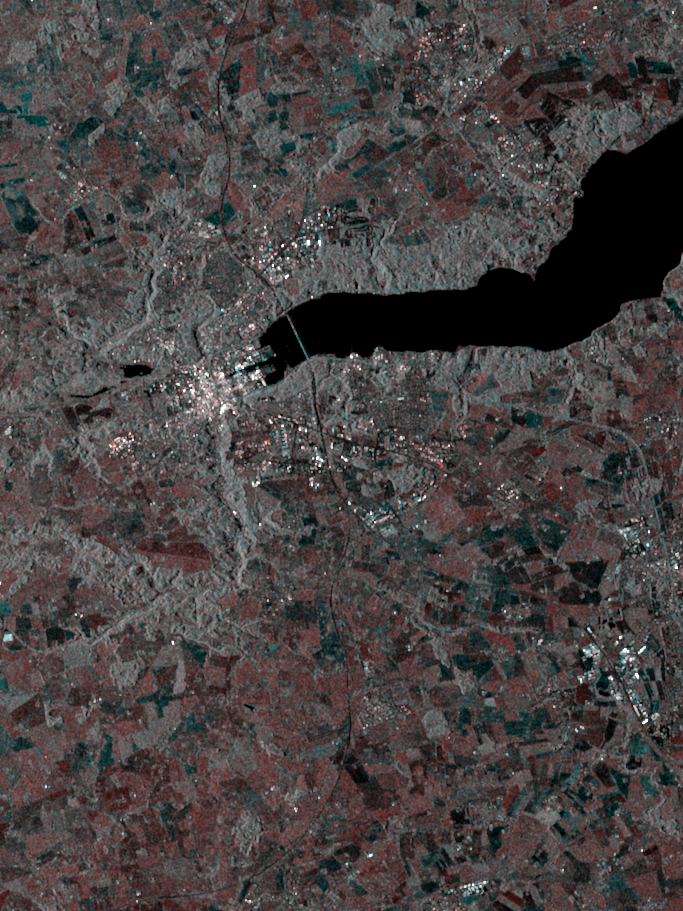

In [24]:
preVH = (scale(pre1_VH,10,15) .+ scale(pre2_VH,10,15)) ./2
intensVH2= Colors.RGB{Float32}.(scale(co_VH,10,15),preVH,preVH)[1:2:end,1:7:end]

In [25]:
## Scale intensity 
maximum(maximum(log.(co_VV))),minimum(minimum(log.(co_VV)))

(21.709636985018175, 9.536763942659247)

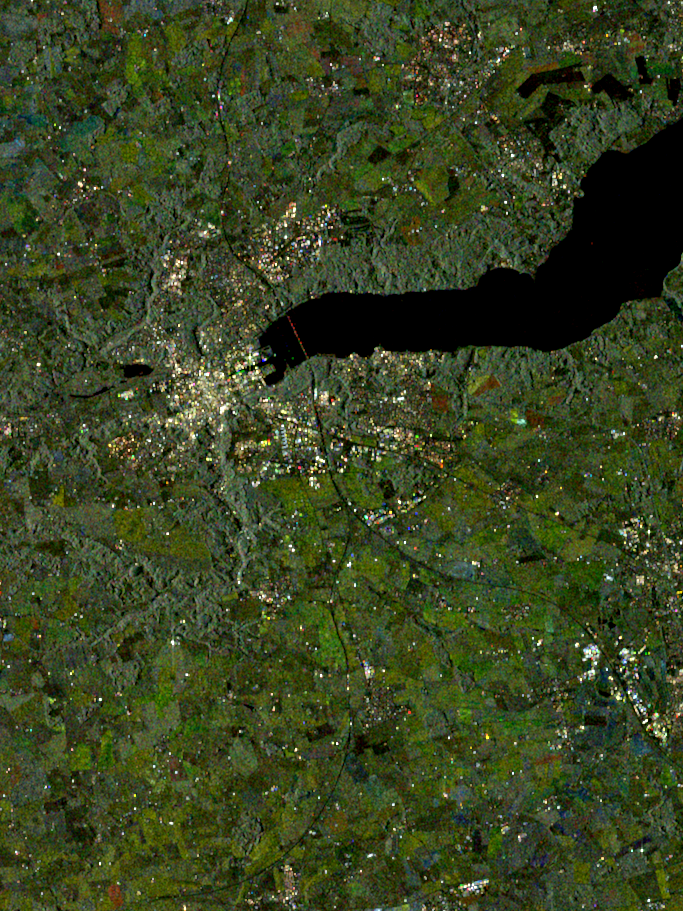

In [26]:
intens1 = Colors.RGB{Float32}.(scale(co_VV,12,17),scale(pre1_VV,12,17),scale(pre2_VV,12,17))[1:2:end,1:7:end]

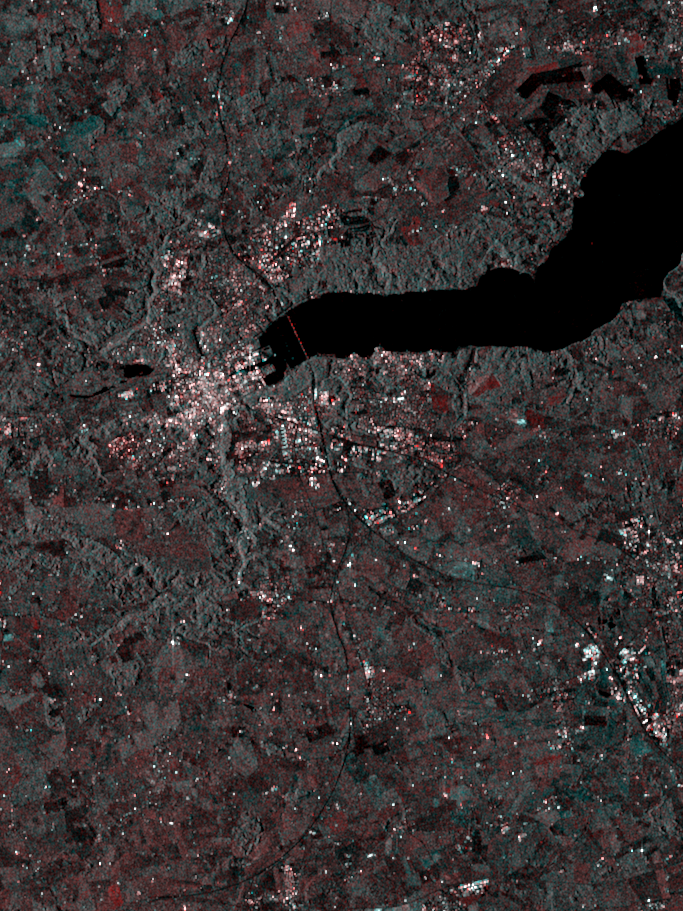

In [27]:
pre = (scale(pre1_VV,12,17) .+ scale(pre2_VV,12,17)) ./2
intens2= Colors.RGB{Float32}.(scale(co_VV,12,17),pre,pre)[1:2:end,1:7:end]

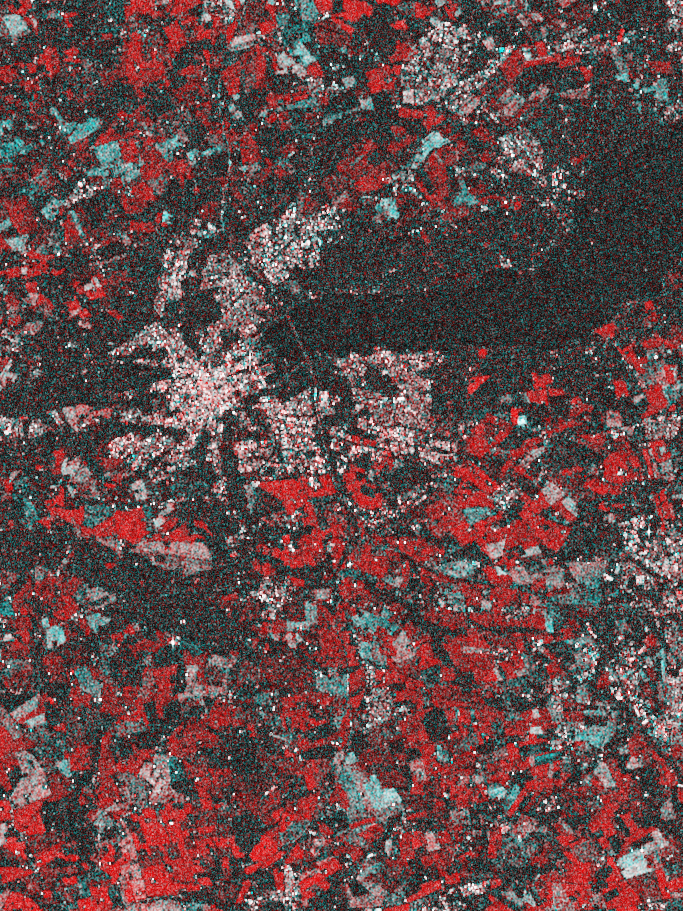

In [28]:
# show coherence 
coherence  = Colors.RGB{Float32}.(abs.(co_gamma),abs.(pre_gamma),abs.(pre_gamma))[1:2:end,1:7:end]

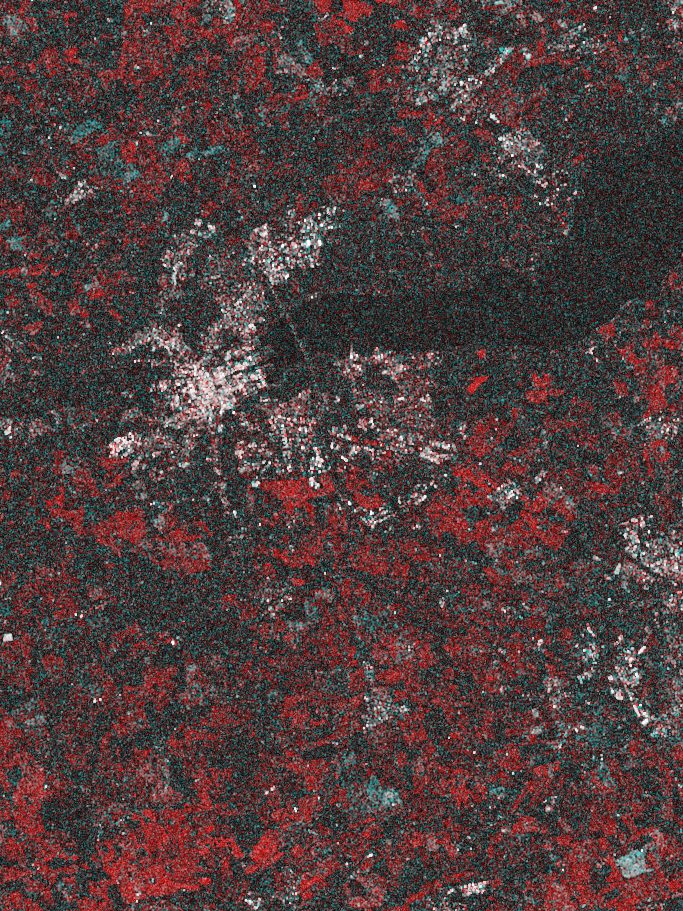

In [29]:
# show coherence 
coherence_VH  = Colors.RGB{Float32}.(abs.(coVH_gamma),abs.(preVH_gamma),abs.(preVH_gamma))[1:2:end,1:7:end]

In [30]:
import FileIO
FileIO.save("coherence_coprepre.jpg",coherence)
FileIO.save("log_itens_copre1pre2.jpg",intens1)
FileIO.save("log_itens_coprepre.jpg",intens2)
FileIO.save("log_VH_copre1pre2.jpg",intensVH1)
FileIO.save("log_VH_coprepre.jpg",intensVH2)